# PRÉ-PROCESSAMENTO DE DADOS

O pré-processamento dos dados para o ML envolve engenharia de dados e engenharia de atributos.

**Engenharia de dados** é o processo de converter dados brutos em dados preparados. 

**A engenharia de atributos** ajusta os dados preparados para criar os atributos esperados pelo modelo de ML. 

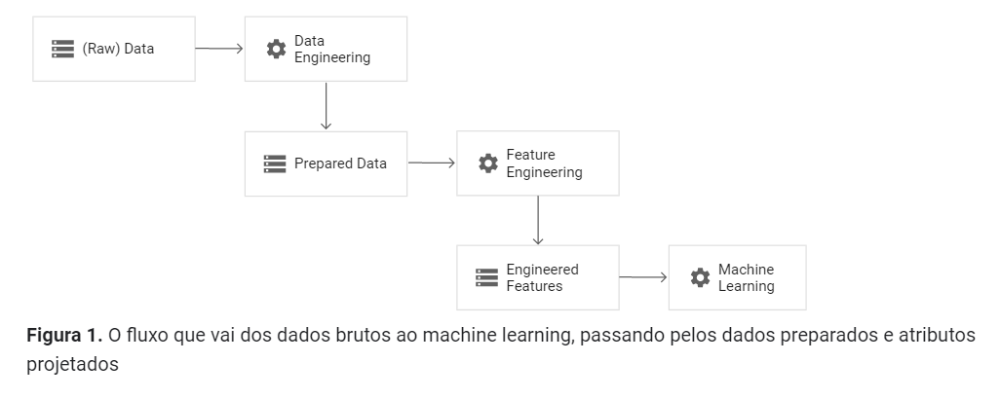

Instalação das bibliotecas...

In [1]:
!pip install spicy       # fornece  otimização, álgebra linear e estatísticas.
!pip install pandas-profiling==2.7.1   # fornece uma rápida análise de dados
!pip install unidecode    #fornece tradução ASCII de texto Unicode

     |████████████████████████████████| 252 kB 4.3 MB/s 
     |████████████████████████████████| 675 kB 42.7 MB/s 
     |████████████████████████████████| 58 kB 5.7 MB/s 
     |████████████████████████████████| 3.1 MB 30.3 MB/s 
     |████████████████████████████████| 812 kB 59.0 MB/s 
     |████████████████████████████████| 28.5 MB 50 kB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=daea4a86c1391575b05e78e422f9c159ce9a5d1ecdce51a87c1c40c79a3357af
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=997fb2721be4d8fb09e71ed3bab27a804fd4643bbd9e0baafeb8e6083c53e89f
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling

Importação das bibliotecas...

In [2]:
import pandas_profiling    #análise exploratória
import re         #expressões regulares
import math        #funções matemáticas
import spacy      #processamento de linguagem natural
import nltk       #processamento de linguagem natural
import pandas as pd    #dataframes
import seaborn as sns   #gráficos
import statistics  as sts     #ferramentas estatística
import numpy as np    #processamento de arrays
from datetime import *     #ferramentas de data e hora
from collections import Counter     #conteiner especializado em contagem
from unidecode import unidecode    #tradução/processamento de texto
import matplotlib.pyplot as plt      #gráficos

Imports para tratamento dos arquivos zip e sistema operacional - 


In [3]:
import zipfile     #manuseio de arquivos zip
import glob    # caminhos de diretórios
import json   #trabalhar com arquivos no formato json
from IPython.core.display import HTML   #representação HTML de um objeto  
import os   #funções do S.O.
from os import listdir   #listagem de diretórios
from os.path import isfile, join   #concatenacomponentes de caminho

Montagem do GDRIVE - ao executar essa célula, você reberá um link para uma conta da Google. Você deve escolher a conta e, na sequência, receberá uma senha de autorização para o Colab acessar seu drive da Google associado a conta escolhida. Você deverá copiar essa senha e colá-la na caixa de entrada de dados que a execução da célula te oferece.

Obs.: Os dados de análise devem estar neste repositório da Google que você associou ao Collab.

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive




---



# DADOS BRUTOS

**Dados brutos (ou apenas dados)** - Isso se refere aos dados no formulário de origem, sem qualquer preparação prévia para o ML. 

OBS.: Observe que você deverá alterar o caminho com a localização do arquivo de análise.

In [30]:
df = pd.read_csv('/content/gdrive/MyDrive/CONTRATOS BNDES/compras-contratos-administrativos-contratos-administrativos.csv', sep = ";", encoding = "UTF-8")
#leitura do arquivo - retorno no formato Data Frame

In [18]:
df.info()    #resumo das informações do arquivo

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2510 entries, 0 to 2509
Data columns (total 20 columns):
 #   Column                                Non-Null Count  Dtype 
---  ------                                --------------  ----- 
 0   ano                                   2510 non-null   int64 
 1   mes                                   2510 non-null   int64 
 2   ocs                                   2510 non-null   object
 3   modalidade                            2510 non-null   object
 4   fundamento_legal                      2364 non-null   object
 5   contratado                            2510 non-null   object
 6   data_de_assinatura                    2510 non-null   object
 7   data_de_publicacao_do_extrato_no_dou  2489 non-null   object
 8   fim_vigencia_original                 2510 non-null   object
 9   fim_vigencia_atualizado               2510 non-null   object
 10  inicio_vigencia                       2510 non-null   object
 11  valor_global_original         

In [19]:
df.head()    #cabeçalho dos dados - para conhecimento dos dados no geral

,ano,mes,ocs,modalidade,fundamento_legal,contratado,data_de_assinatura,data_de_publicacao_do_extrato_no_dou,fim_vigencia_original,fim_vigencia_atualizado,inicio_vigencia,valor_global_original,valor_global_acumulado,moeda,data_de_atualizacao,arquivos_do_contrato,objeto,link_arquivos,observacao,situacao
0,2006,11,0265/2006,Dispensa de Licitação 110/2006,"ART. 24,XIII",43588755000161 - FUNDACAO PARA DESENVOLVIMENTO...,2006-11-30,2006-11-09,2013-12-30,2013-12-30,2013-07-02,"0,0","311270,19",Real,2021-07-27,Baixe o contrato OCS 0265/2006 e seus anexos (...,Carga de Contratos,https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado
1,2008,1,0005/2008,Pregão Eletrônico 41/2007,NaN,58069360000120 - STEFANINI CONSULTORIA E ASSES...,2008-01-18,2008-02-12,2014-01-17,2014-01-17,2013-01-18,"0,0","417867,27",Real,2021-07-27,Baixe o contrato OCS 0005/2008 e seus anexos (...,Carga de Contratos,https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado
2,2008,11,0316/2008,Pregão Eletrônico 35/2008,NaN,32086043000128 - TOTAL COPY COMERCIO DE COPIAD...,2008-11-28,2008-12-09,2014-02-08,2014-05-27,2009-02-09,"0,0","28916,71",Real,2021-07-27,Baixe o contrato OCS 0316/2008 e seus anexos (...,"Aquisição de 92 impressoras monocromáticas, co...",https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado
3,2008,11,0320/2008,Pregão Eletrônico 35/2008,NaN,05633420000129 - VENUS WORLD COM EQUIP MATERIA...,2008-11-28,2008-12-08,2014-03-08,2014-03-08,2009-03-09,"0,0","18048,82",Real,2021-07-27,Baixe o contrato OCS 0320/2008 e seus anexos (...,"Aquisição de 56 impressoras a laser coloridas,...",https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado
4,2009,3,0045/2009,Dispensa de Licitação 8/2009,"ART. 24,X",33663683000116 - UNIVERSIDADE FEDERAL DO RIO D...,2009-03-02,2009-02-04,2014-03-01,2014-03-01,2009-03-02,"0,0","3735376,11",Real,2021-07-27,Baixe o contrato OCS 0045/2009 e seus anexos (...,Locação imobiliária referente a quatro pavimen...,https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado


In [20]:
df.describe()   #resumo estatístico dos dados

,ano,mes
count,2510.000000,2510.000000
mean,2015.991235,6.718327
std,2.553673,3.163277
min,2006.000000,1.000000
25%,2014.000000,4.000000
50%,2016.000000,7.000000
75%,2018.000000,9.000000
max,2021.000000,12.000000




---



---



---



# TRATAMENTO DOS DADOS

**DICIONÁRIO DE DADOS CONFORME BNDES**

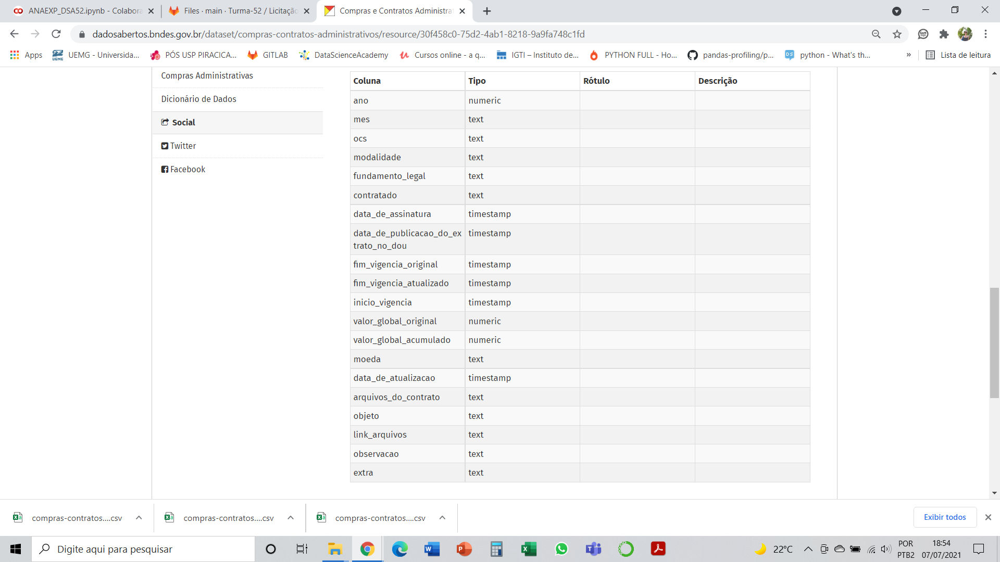

FAZENDO CASTING DOS DADOS.

Os dados serão colocados no formato informado pelo Dicionário de Dados do BNDES. Ainda, por conveniência da equipe, datas serão convertidas para o formato brasileiro.

In [31]:
df['data_de_assinatura'] = pd.to_datetime(df.data_de_assinatura)   #converte para o tipo data
df['data_de_assinatura'] = df['data_de_assinatura'].dt.strftime('%d/%m/%Y')   #muda para o formato brasileiro
df['data_de_publicacao_do_extrato_no_dou'] = pd.to_datetime(df.data_de_publicacao_do_extrato_no_dou) #converte para o tipo data
df['data_de_publicacao_do_extrato_no_dou'] = df['data_de_publicacao_do_extrato_no_dou'].dt.strftime('%d/%m/%Y') #muda para o formato brasileiro
df['fim_vigencia_original'] = pd.to_datetime(df.fim_vigencia_original) #converte para o tipo data
df['fim_vigencia_original'] = df['fim_vigencia_original'].dt.strftime('%d/%m/%Y') #muda para o formato brasileiro
df['fim_vigencia_atualizado'] = pd.to_datetime(df.fim_vigencia_atualizado) #converte para o tipo data
df['fim_vigencia_atualizado'] = df['fim_vigencia_atualizado'].dt.strftime('%d/%m/%Y') #muda para o formato brasileiro
df['inicio_vigencia'] = pd.to_datetime(df.inicio_vigencia) #converte para o tipo data
df['inicio_vigencia'] = df['inicio_vigencia'].dt.strftime('%d/%m/%Y') #muda para o formato brasileiro
df['data_de_atualizacao'] = pd.to_datetime(df.data_de_atualizacao) #converte para o tipo data
df['data_de_atualizacao'] = df['data_de_atualizacao'].dt.strftime('%d/%m/%Y') #muda para o formato brasileiro
df['valor_global_original'] = [x.replace(",", ".") for x in df['valor_global_original']]  #troca vírgula por ponto nos valores 
df['valor_global_original'] = df['valor_global_original'].astype(float)  #troca vírgula por ponto nos valores 
df['valor_global_acumulado'] = [x.replace(",", ".") for x in df['valor_global_acumulado']]  #troca vírgula por ponto nos valores 
df['valor_global_acumulado'] = df['valor_global_acumulado'].astype(float)  #troca vírgula por ponto nos valores 


Obs.: as datas estão no formato Brasileiro como STRINGS

Para eventuais operações com datas, é conveniente matê-las no formato de data. Então serão acrescentadas 6 colunas (20 a 25), com essas datas no formato adequado para operações matemáticas.

In [32]:
M = []   #lista vazia
M = pd.to_datetime(df.data_de_publicacao_do_extrato_no_dou)   #converte para formato data
df.insert(20, 'Dt_Pub_DOU', M)    #insere no dataframe
M = pd.to_datetime(df.data_de_assinatura)  #converte para formato data
df.insert(21, 'Dt_Assin',M)     #insere no dataframe
M = pd.to_datetime(df.inicio_vigencia)  #converte para formato data
df.insert(22, 'Dt_In_Vig', M)     #insere no dataframe
M = pd.to_datetime(df.fim_vigencia_original)  #converte para formato data
df.insert(23, 'Dt_FIM_Vig_Orig', M)     #insere no dataframe
M = pd.to_datetime(df.data_de_atualizacao)  #converte para formato data
df.insert(24, 'Dt_Atual', M)     #insere no dataframe
M = pd.to_datetime(df.fim_vigencia_atualizado)  #converte para formato data
df.insert(25, 'Dt_FIM_Vig_Atualiz', M)     #insere no dataframe

**ORGANIZANDO** A COLUNA OCS - mantive a coluna original e criei duas, separando número da ordem de serviço (N_ordem) e ano da ordem de serviço (Ano_ordem)

In [33]:
ocs = df.ocs     #armazena a coluna de ordem de serviço
dfAux = df['ocs'].str.partition('/')[[0, 2]].rename({0: 'N_ordem', 2: 'Ano_ordem'}, axis=1)    #divide os dados pelo separador /
df.insert(26, 'N_Or_Serv', dfAux['N_ordem'])    #armazena aparte referente ao numero da ordem de serviço em nova coluna do df
df.insert(27,'Ano_Or_Serv',dfAux['Ano_ordem'] )   #armazena aparte referente ao ano da ordem de serviço em nova coluna do df

Exemplo de conteúdo da coluna modalidade:

Dispensa de Licitação 110/2006

Pregão Eletrônico 41/2007	

**ORGANIZANDO** O TEXTO DA COLUNA MODALIDADE - retirei os caracteres UTF-8 e os números, criando a nova coluna TipoMod que cntém apenas os textos:

Dispensa de Licitação

Pregão Eletrônico

In [34]:
modalidade = df['modalidade']    #separa a coluna modalidade
r = re.compile(r'[^\D]*|[\/]*')    #cria e compila expressão regular para remoção de textos ([^\D]*) e da  barra (\/)
M=[]
for i in modalidade:      #percorre a lista modalidade
  aux1 = i.lower()         #transforma em letras minúsculas
  aux2 = unidecode(aux1)     #retira caracteres especiais
  aux3 = aux2.rstrip()    # encontra os padrões da expressão regular
  M.append(r.sub('', aux3))    #substitui os padrões encontrados por vazio 

df.insert(28,'TipoMod',M )     #insere numa nova coluna do df com o tippo da modalidade

SEPAREI NÚMERO E ANO DA MODALIDADE.

In [38]:
modalidade = df['modalidade']     #separa novamente a coluna modalidade

M = []
for i in modalidade:      #percorre a coluna modalidade
  aux = i.rsplit()      #retira letras, usando a expressão regular anterior
  M.append(aux[-1])     # concatena os resultados na lista M

li = []
a =[]
b = []
for i in range(len(M)):     #percorre a lista
  li.append(M[i].split('/'))    #separando e concatenado nas listas vazias criadas fora desse laço
  a.append(li[i][0])
  b.append(li[i][1])

df.insert(29,'N_modalid',a)    #insere coluna no df
df.insert(30,'Ano_modalid',b )  #insere coluna no df

DIVIDI A COLUNA FUNDAMENTO_LEGAL - SEPARANDO ARTIGO/LEI DE INCISO.

Formato do texto da coluna:   ART. 24,XIII

In [40]:
dfAux = df['fundamento_legal'].str.partition(',')[[0, 2]].rename({0: 'Artigo/Lei', 2: 'Inciso'}, axis=1)   #separei pela virgula e coloquei o resultado num df auxiliar
df.insert(31, 'Artigo/Lei', dfAux['Artigo/Lei'])     #inseri as colunas do df auxiliar no df original
df.insert(32,'Inciso',dfAux.Inciso)

A coluna criada Artigo/Lei possui diversas informações escritas de manieiras diferentes, como N.° e Nº, que significam a mesma coisa. Portanto, foi necessário tratá-las.

In [42]:
r = re.compile(r'\ N\.° | Nº')   #expressão regular 
objeto = df['Artigo/Lei']     #separação da coluna a ser tratada

M=[]
for i in objeto:              #percorre a coluna
  if isinstance(i, str):     #se encontrar o padrão da expressão regular
     M.append(r.sub('', i))    #remove e concatena na lista M
  else: 
   M.append(i)          #se não achar, apenas concatena em M

df['Artigo/Lei'] = M    #atualiza o df

Continuando o tratamento de informações equivalentes

In [43]:
r = re.compile(r'\ Lei 13\.303\/16 |LEI 13\.303\/16')  #expressão regular 
objeto = df['Artigo/Lei']   #separação da coluna a ser tratada
M=[]
for i in objeto:            #percorre a coluna
  if isinstance(i, str):      #se encontrar o padrão da expressão regular
     M.append(r.sub('LEI 13.303/2016', i))    #remove e concatena na lista M
  else:  
   M.append(i)      #se não achar, apenas concatena em M

df['Artigo/Lei'] = M    #atualiza o df

DIVIDI O CONTRATADO EM DUAS COLUNAS: CPF/CNPJ E NOME DO CONTRATADO.

In [44]:
dfAux = df['contratado'].str.partition('-')[[0, 2]].rename({0: 'CNPJ/CPF Contratado', 2: 'Contratado'}, axis=1)    #separei pelo - e coloquei o resultado num df auxiliar
df.insert(33, 'CNPJ/CPF Contratado', dfAux['CNPJ/CPF Contratado'])    #inseri as colunas do df auxiliar no df original
df.insert(34,'Nome Contratado',dfAux.Contratado )


RETIREI DA COLUNA arquivos_do_contrato A OSC.

In [46]:
Arq = df['arquivos_do_contrato']    #separei a coluna
r = re.compile(r'^[\D]+')       #expressão regular  tudo que não é digito
M=[]
for i in Arq:          #percorri a coluna
  aux2 = unidecode(i)    #retirei caracteres especiais, caso existam
  M.append(r.sub('',aux2))    # remove a expressão regular e concatena na lista M
N = []
for i in range(len(M)):     #remove os 10 primeiros caracteres da lista resultado da ação anterior
  a = M[i][0:9]
  N.append(a)

df.insert(35,'OSC_contrato',N)    #inser no df

SEPAREI NUMERO E ANO DA OSC DO CONTRATO.

Ainda separei em colunas difrentes o ano da ordem de serviço

In [49]:
M = df.OSC_contrato     #separei a coluna
dfAux = df['OSC_contrato'].str.partition('/')[[0, 2]].rename({0: 'Num_osc_contrato', 2: 'Ano_osc_contrato'}, axis=1)   #separei pelo / e coloquei o resultado num df auxiliar
df.insert(36, 'Num_osc_contrato', dfAux['Num_osc_contrato'])
df.insert(37,'Ano_osc_contrato',dfAux.Ano_osc_contrato )      #inseri as colunas do df auxiliar no df original

**ORGANIZANDO** A COLUNA 28 OBJETO.

letras minúsculas, sem UTF-8, sem (I),(i),' e "

In [51]:
r = re.compile(r'\((I|i)\)|\'|\"|"i"|"i."|"N.°"|Nº')   #expressão regulara para remover caracteres indesejados
objeto = df['objeto']    #separação da coluna

M=[]
for i in objeto:     #percorre a coluna
  aux1 = i.lower()    #converte em minúsculas
  aux2 = unidecode(aux1)    #retira caracteres especiais
  aux3 = aux2.rstrip()    #encontra as ocorrências da expressão regular
  M.append(r.sub('', aux3))   #remove essas ocorrências

df['objeto'] = M    #insere coluna no df

Resultado dessa "filtragem"

In [52]:
df["objeto"]

0                                      carga de contratos
1                                      carga de contratos
2       aquisicao de 92 impressoras monocromaticas, co...
3       aquisicao de 56 impressoras a laser coloridas,...
4       locacao imobiliaria referente a quatro pavimen...
                              ...                        
2505     avaliacao de um terreno urbano e de um predio...
2506    prestacao de servico de comunicacao de dados p...
2507    contratacao de servicos de inspecao e auditori...
2508    realizacao de um programa de desenvolvimento d...
2509    acesso completo (full), por um ano, a base all...
Name: objeto, Length: 2510, dtype: object

Utilizando Processamento de Linguagem Natural para encontrar expressões similares nos objetos.

In [53]:
nltk.download('stopwords')   #carrea stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [54]:
stopwords = set(nltk.corpus.stopwords.words('portuguese'))   #escolha do idioma Português

In [56]:
w =[]
for i in M:            
  texto = i.split(' ')   #percorre a coluna( que ainda está na Lista M)
  f_w =  [word for word in texto if word not in stopwords ]    #removendo as palavras que NÃO SÃO STOPWORDS
  w.append(f_w[0])    #concatena na lista w


In [57]:
df.insert(38,'tipo_obj',w )   #insere no df



---


**CRIANDO A COLUNA NÚMERO DE ADITIVOS POR CONTRATO**

Baixei todos os arquivos de contratos que estavam no dataframe, 

coluna de link de contratos.

Para cada linha do df foi criado um diretório, e nesse diretório 
foi descompactado seu arquivo de contratos.

Contei então a quantidade de aditivos presente em cada diretório.

Ressaltando que haviam links quebrados e linhas sem links para o contrato.

Criei um dicionário onde a chave é a linha da tabela do BNDES e o valor é o número do arquivo zip correspondente aos contratos da referida linha

In [64]:
OD = {}    #criação do dicionário
r = re.compile(r'[^(\d)]')      #expressão regular tudo que não é número
for i in range(len(df.link_arquivos)):     #percorre o tamnho da coluna df.link_arquivo
  f = df.link_arquivos[i]       #para cada elemento
  if pd.isna(f):      #se for nulo
    m=str(i)      #coloca i na variável m
  else:      #senão
    m = r.sub('', f)    #remove expressão regular do conteúdo    
  OD.update({i:m})    # armazena no dicionário a linha e o numero do arquivo ZIP

DESCOMPACTEI TODOS OS ARQUIVOS DE CONTRATOS - precisa de todos os contratos zipados em uma pasta do seu Google Drive. 

**A pasta *DESCOMP* deve estar criada e vazia.**

In [65]:
path2 = '/content/gdrive/MyDrive/CONTRATOS BNDES/ContratosBNDES/'    #defini minha pasta do Google drive que armazena os arquivos compactados
len(OD)    #conferi o temanho do dicionário

2510

In [67]:
cont = 0              #inicializei a variável cont
D_NUM_arq = {}     #incializei o dicionário
os.chdir('/content/gdrive/MyDrive/CONTRATOS BNDES/DESCOMP')    #criei o diretório para descompactação dos arquivos

n = 0   #inicializei outro contador
for i in OD:    # percorre o dicionário
  dir=OD[i]     #pegando o nome do arquivo zip
  arq = path2+dir+'.zip'  #concateno o caminho e a extenção

  os.mkdir(str(i))    #crio diretório com chave do dicionário
  os.chdir(str(i))    #mudo pra esse novo diretório
  arquivos = []     #zero a lista arquivos
  
  if os.path.exists(arq):      #se existe o caminho
    zip_object = zipfile.ZipFile(file = arq, mode = 'r')    #abro arquivo zip
    zip_object.extractall('./')    #extraio o conteúdo
    arquivos = os.listdir()   #armazeno o conteúdo do diretório na lista arquivos
    D_NUM_arq.update({i:arquivos})   #atualizo o dicionário
    
    zip_object.close()    #fecho o arquivo zip
  else:         #se não existe o caminho
    cont = cont+1    #atualizo contador
    D_NUM_arq.update({i:arquivos})    #atualizo o dicionário com a lista arquivos vazia
    
    
  os.chdir("..")   #retorno 1 diretório
  os.getcwd()   


len(D_NUM_arq)   #confirmo tamanho do dicionário

2510

Limpei os nomes de arquivos a fim de chegar a palavra ADITIVO 0X.

In [68]:
D_cont = {}
sc = 0
r = re.compile(r'(\d+\$\d+)|(\d+_\d+)|(\.pdf)|(\.PDF)|ip|\$|contrato')   #EXPRESSÃO REGULAR PARA ENCONTRAR contrato
r2 = re.compile(r'(((a|A)ditivo)(\s)*(\d)+)|((ADITIVO)(\s)*(\d)+)')    #expressão regular para encontrar aditivo/Aditivo/ADITIVO
for i in range(len(D_NUM_arq)): #percorre o tamanho do dicionário
  aux = D_NUM_arq[i]    #armazena o elemento i na variável aux
  c = 0
  if len(D_NUM_arq[i]) > 0:     #se houver dados
    for j in range(len(aux)):   #percorre cada elemento
      aux2 = aux[j]     
      m = r.sub('', aux2)    #removendo a expressão regular r
      if (bool(re.search(r2,m))) & (len(m)<=10):  #se o resultado form maior que 10, conte +1 aditivo
        c = c+1
    D_cont.update({i:c})    #atualize o dicionário
  else:
    sc = sc + 1   #se não houver dados
    D_cont.update({i:-1})   #atualize o dicionário com valor -1 (indica diretório vazio)
print(len(D_cont))   #confere tamanho do dicionário            

2510


In [69]:
listOfValues = D_cont.values()     #separei os valores do dicionário
listOfValues = list(listOfValues)    #converti em lista

M = []
for i in range(len(listOfValues)):
  M.append(listOfValues[i])   #concatenei na lista M

Adicionei a quantidade de aditivos no dataframe.

In [70]:
df.insert(39,'QUANT_ADIT',M)   #adicionei no df

In [71]:
df.info()    #resumo de informações contidas no df atual

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2510 entries, 0 to 2509
Data columns (total 40 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   ano                                   2510 non-null   int64         
 1   mes                                   2510 non-null   int64         
 2   ocs                                   2510 non-null   object        
 3   modalidade                            2510 non-null   object        
 4   fundamento_legal                      2364 non-null   object        
 5   contratado                            2510 non-null   object        
 6   data_de_assinatura                    2510 non-null   object        
 7   data_de_publicacao_do_extrato_no_dou  2489 non-null   object        
 8   fim_vigencia_original                 2510 non-null   object        
 9   fim_vigencia_atualizado               2510 non-null   object        
 10  

SALVEI O ARQUIVO

In [72]:
df.to_csv('/content/gdrive/MyDrive/CONTRATOS BNDES/dfcontratosadm.csv')

# DADOS PREPARADOS

**DADOS PREPARADOS** - refere ao conjunto de dados no formato pronto para sua tarefa de ML. As fontes de dados foram analisadas, unidas e colocadas em uma forma tabular. Os dados foram agregados e resumidos na granularidade correta.

**Atributos projetados:** atributos ajustados esperados pelo modelo.


```
 20  Dt_Pub_DOU                            2489 non-null   datetime64[ns]
 21  Dt_Assin                              2510 non-null   datetime64[ns]
 22  Dt_In_Vig                             2510 non-null   datetime64[ns]
 23  Dt_FIM_Vig_Orig                       2510 non-null   datetime64[ns]
 24  Dt_Atual                              2510 non-null   datetime64[ns]
 25  Dt_FIM_Vig_Atualiz                    2510 non-null   datetime64[ns]
 26  N_Or_Serv                             2510 non-null   object        
 27  Ano_Or_Serv                           2510 non-null   object        
 28  TipoMod                               2510 non-null   object        
 29  N_modalid                             2510 non-null   object        
 30  Ano_modalid                           2510 non-null   object        
 31  Artigo/Lei                            2364 non-null   object        
 32  Inciso                                2364 non-null   object        
 33  CNPJ/CPF Contratado                   2510 non-null   object        
 34  Nome Contratado                       2510 non-null   object        
 35  OSC_contrato                          2510 non-null   object        
 36  Num_osc_contrato                      2510 non-null   object        
 37  Ano_osc_contrato                      2510 non-null   object        
 38  tipo_obj                              2510 non-null   object        
 39  QUANT_ADIT                            2510 non-null   int64         


# ANÁLISE DOS DADOS

---



---



---



# Estatístiva descritiva:

**Tipos de Variáveis**

In [73]:
dfca = pd.read_csv('/content/gdrive/MyDrive/CONTRATOS BNDES/dfcontratosadm.csv')   #carreguei o df com dados originais e preparados

In [74]:
dfca.head(1)   #visualização dos dados

,Unnamed: 0,ano,mes,ocs,modalidade,fundamento_legal,contratado,data_de_assinatura,data_de_publicacao_do_extrato_no_dou,fim_vigencia_original,fim_vigencia_atualizado,inicio_vigencia,valor_global_original,valor_global_acumulado,moeda,data_de_atualizacao,arquivos_do_contrato,objeto,link_arquivos,observacao,situacao,Dt_Pub_DOU,Dt_Assin,Dt_In_Vig,Dt_FIM_Vig_Orig,Dt_Atual,Dt_FIM_Vig_Atualiz,N_Or_Serv,Ano_Or_Serv,TipoMod,N_modalid,Ano_modalid,Artigo/Lei,Inciso,CNPJ/CPF Contratado,Nome Contratado,OSC_contrato,Num_osc_contrato,Ano_osc_contrato,tipo_obj,QUANT_ADIT
0,0,2006,11,0265/2006,Dispensa de Licitação 110/2006,"ART. 24,XIII",43588755000161 - FUNDACAO PARA DESENVOLVIMENTO...,30/11/2006,09/11/2006,30/12/2013,30/12/2013,02/07/2013,0.0,311270.19,Real,27/07/2021,Baixe o contrato OCS 0265/2006 e seus anexos (...,carga de contratos,https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado,2006-09-11,2006-11-30,2013-02-07,2013-12-30,2021-07-27,2013-12-30,265,2006,dispensa de licitacao,110,2006,ART. 24,XIII,43588755000161,FUNDACAO PARA DESENVOLVIMENTO TECNOLOGICO DA ...,0265/2006,265.0,2006.0,carga,8


In [75]:
dfca.info()   #informações dos dados

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2510 entries, 0 to 2509
Data columns (total 41 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            2510 non-null   int64  
 1   ano                                   2510 non-null   int64  
 2   mes                                   2510 non-null   int64  
 3   ocs                                   2510 non-null   object 
 4   modalidade                            2510 non-null   object 
 5   fundamento_legal                      2364 non-null   object 
 6   contratado                            2510 non-null   object 
 7   data_de_assinatura                    2510 non-null   object 
 8   data_de_publicacao_do_extrato_no_dou  2489 non-null   object 
 9   fim_vigencia_original                 2510 non-null   object 
 10  fim_vigencia_atualizado               2510 non-null   object 
 11  inicio_vigencia  

**Medidas de Tendência Central**

In [76]:
dfca.describe()   #resumo estatístico dos dados numéricos

,Unnamed: 0,ano,mes,valor_global_original,valor_global_acumulado,N_Or_Serv,N_modalid,Ano_modalid,Num_osc_contrato,Ano_osc_contrato,QUANT_ADIT
count,2510.000000,2510.000000,2510.000000,2.510000e+03,2.510000e+03,2510.000000,2510.000000,2510.000000,2418.000000,2418.000000,2510.000000
mean,1254.500000,2015.991235,6.718327,1.483173e+06,2.949923e+06,245.705179,51.469721,2018.823108,240.127378,2016.033912,0.328685
std,724.718911,2.553673,3.163277,1.272424e+07,2.481535e+07,228.609919,55.018049,159.401626,146.634788,2.580056,1.073956
min,0.000000,2006.000000,1.000000,0.000000e+00,0.000000e+00,1.000000,1.000000,1902.000000,1.000000,2005.000000,-1.000000
25%,627.250000,2014.000000,4.000000,3.770788e+03,2.200000e+04,121.000000,4.000000,2014.000000,119.000000,2014.000000,0.000000
50%,1254.500000,2016.000000,7.000000,3.500000e+04,1.157816e+05,226.500000,33.000000,2016.000000,223.000000,2016.000000,0.000000
75%,1881.750000,2018.000000,9.000000,3.500000e+05,6.000000e+05,358.750000,81.000000,2017.000000,356.000000,2018.000000,0.000000
max,2509.000000,2021.000000,12.000000,4.213809e+08,6.600000e+08,9014.000000,477.000000,9999.000000,574.000000,2021.000000,11.000000


**Tabelas de frequências**

COMPRAS POR ANO

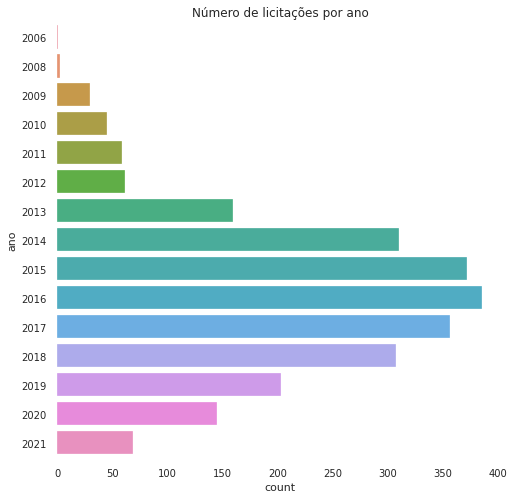

In [77]:
plt.figure(figsize = (8,8))
plt.title('Número de licitações por ano')
sns.countplot(y = 'ano', data = dfca)
plt.show()

In [78]:
aux=  dfca.query('ano==2007')   #apenas para confirmar que não houveram compras em 2007
aux

,Unnamed: 0,ano,mes,ocs,modalidade,fundamento_legal,contratado,data_de_assinatura,data_de_publicacao_do_extrato_no_dou,fim_vigencia_original,fim_vigencia_atualizado,inicio_vigencia,valor_global_original,valor_global_acumulado,moeda,data_de_atualizacao,arquivos_do_contrato,objeto,link_arquivos,observacao,situacao,Dt_Pub_DOU,Dt_Assin,Dt_In_Vig,Dt_FIM_Vig_Orig,Dt_Atual,Dt_FIM_Vig_Atualiz,N_Or_Serv,Ano_Or_Serv,TipoMod,N_modalid,Ano_modalid,Artigo/Lei,Inciso,CNPJ/CPF Contratado,Nome Contratado,OSC_contrato,Num_osc_contrato,Ano_osc_contrato,tipo_obj,QUANT_ADIT


In [79]:
aux=  dfca.query('ano==2006')    #apenas para confirmar que houveram poucas compras em 2006
aux

,Unnamed: 0,ano,mes,ocs,modalidade,fundamento_legal,contratado,data_de_assinatura,data_de_publicacao_do_extrato_no_dou,fim_vigencia_original,fim_vigencia_atualizado,inicio_vigencia,valor_global_original,valor_global_acumulado,moeda,data_de_atualizacao,arquivos_do_contrato,objeto,link_arquivos,observacao,situacao,Dt_Pub_DOU,Dt_Assin,Dt_In_Vig,Dt_FIM_Vig_Orig,Dt_Atual,Dt_FIM_Vig_Atualiz,N_Or_Serv,Ano_Or_Serv,TipoMod,N_modalid,Ano_modalid,Artigo/Lei,Inciso,CNPJ/CPF Contratado,Nome Contratado,OSC_contrato,Num_osc_contrato,Ano_osc_contrato,tipo_obj,QUANT_ADIT
0,0,2006,11,0265/2006,Dispensa de Licitação 110/2006,"ART. 24,XIII",43588755000161 - FUNDACAO PARA DESENVOLVIMENTO...,30/11/2006,09/11/2006,30/12/2013,30/12/2013,02/07/2013,0.0,311270.19,Real,27/07/2021,Baixe o contrato OCS 0265/2006 e seus anexos (...,carga de contratos,https://www.bndes.gov.br/arquivos/contratos-ad...,Observação: O valor global acumulado considera...,Encerrado,2006-09-11,2006-11-30,2013-02-07,2013-12-30,2021-07-27,2013-12-30,265,2006,dispensa de licitacao,110,2006,ART. 24,XIII,43588755000161,FUNDACAO PARA DESENVOLVIMENTO TECNOLOGICO DA ...,0265/2006,265.0,2006.0,carga,8


COMPRAS POR MÊS

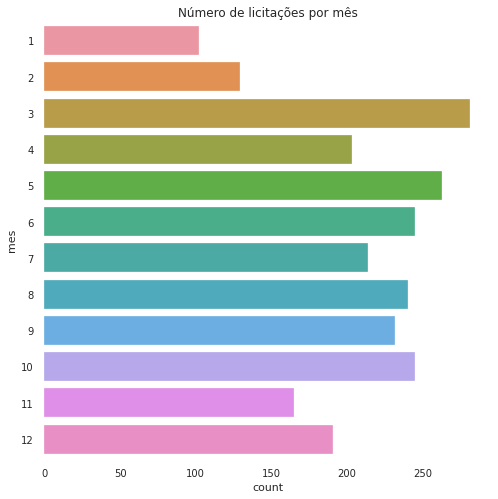

In [80]:
plt.figure(figsize = (8,8))
plt.title('Número de licitações por mês')
sns.countplot(y = 'mes', data = dfca)
plt.show()

QUANTAS MODALIDADES DE CONTRATO EXISTEM?

In [81]:
len(dfca.TipoMod.unique())

16

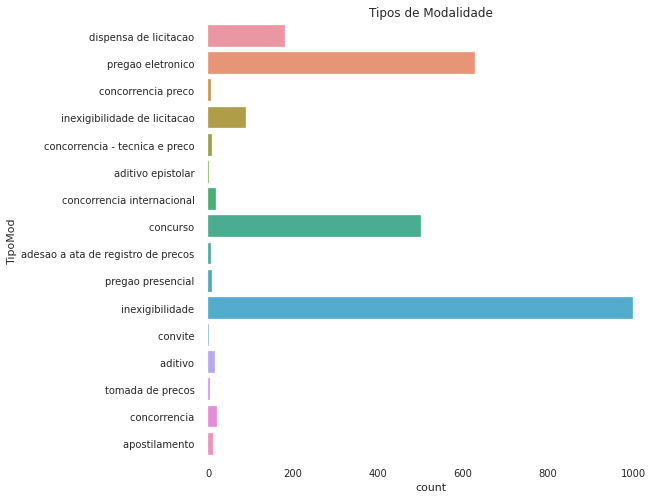

In [82]:
plt.figure(figsize = (8,8))
plt.title('Tipos de Modalidade')
sns.countplot(y = 'TipoMod', data = dfca)
plt.show()

FUNDAMENTO LEGAL

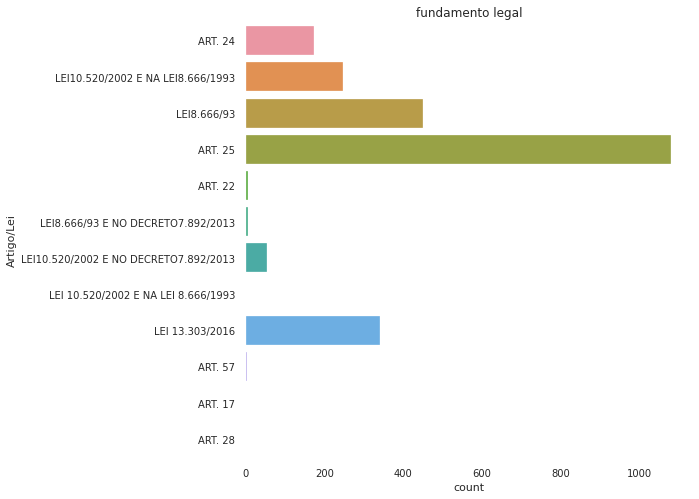

In [83]:
plt.figure(figsize = (8,8))
plt.title('fundamento legal')
sns.countplot(y = 'Artigo/Lei', data = dfca)
plt.show()

In [84]:
A =dfca["Artigo/Lei"].value_counts()
A

ART. 25                                  1080
LEI8.666/93                               450
LEI 13.303/2016                           340
LEI10.520/2002 E NA LEI8.666/1993         247
ART. 24                                   174
LEI10.520/2002 E NO DECRETO7.892/2013      54
ART. 22                                     6
LEI8.666/93 E NO DECRETO7.892/2013          6
ART. 57                                     4
ART. 17                                     1
ART. 28                                     1
LEI 10.520/2002 E NA LEI 8.666/1993         1
Name: Artigo/Lei, dtype: int64

Art 25 (lei 8.666) - é inexigivel a licitação quando houver inviabilidade de competição, em especial: I. para aquisição de materiais, equipantos ou gêneros de fornecedor exclusivo; II. contratação de serviços técnicos de natureza singular (menos publicidade e divulgação); III. profissional de qualquer setor artistico.

CONTRATADO

O QUE PODEMOS SABER DOS CONTRATADOS?

In [85]:
lista = dfca.loc[:,'CNPJ/CPF Contratado'].copy()
unicas = lista.unique()

In [86]:
L=[]
for p in unicas:
        for t in lista:
            if p == t:
                L.append(t)
freq = Counter(lista)
Counter(lista).most_common(20)

[(' ', 125),
 ('02162646000109 ', 21),
 ('04297469000195 ', 21),
 ('05080793000110 ', 20),
 ('62173620000180 ', 15),
 ('36542025000164 ', 15),
 ('01914765000108 ', 15),
 ('09346601000125 ', 13),
 ('33372251000156 ', 13),
 ('19567832000112 ', 13),
 ('33641663000144 ', 12),
 ('13429948000109 ', 12),
 ('00000000000191 ', 11),
 ('11004787000186 ', 11),
 ('17970044000147 ', 11),
 ('18799897000120 ', 11),
 ('60501293000112 ', 10),
 ('34152660000100 ', 10),
 ('07594862000139 ', 9),
 ('00246471000184 ', 9)]

HÁ 116 CONTRATOS COM CPF/CNPJ NULOS - A QUE SE REFEREM ESSES CONTRATOS?

In [87]:
pandas_profiling.ProfileReport(dfca)

Summarize dataset:   0%|          | 0/53 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

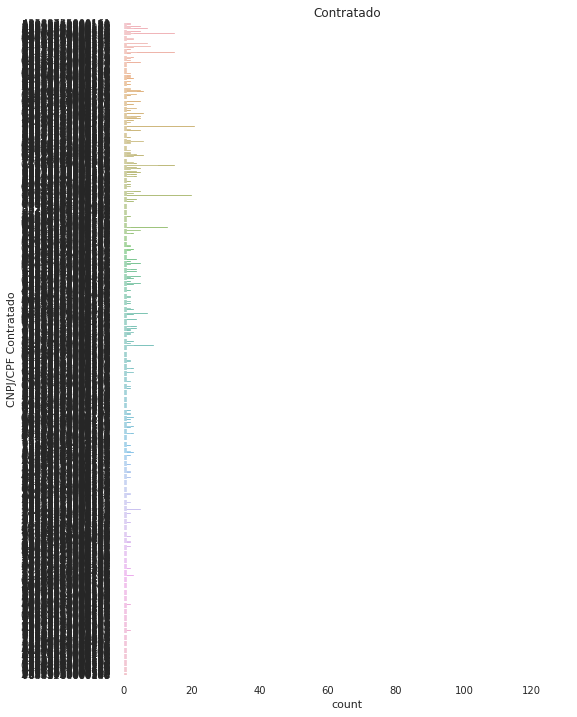

In [88]:

plt.figure(figsize = (8,12))
plt.title('Contratado')
sns.countplot(y = 'CNPJ/CPF Contratado', data = dfca)
plt.show()

HÁ DATAS DE ASSINATURAS ANTERIORES À DATA DE PUBLICAÇÃO DO EXTRATO NO DOU?

In [89]:
Erros_datas1 = []
dfca['Dt_Assin'] = pd.to_datetime(dfca.Dt_Assin)
dfca['Dt_Pub_DOU'] = pd.to_datetime(dfca.Dt_Pub_DOU)
Erros_datas1 = dfca.Dt_Assin - dfca.Dt_Pub_DOU
C = 0
E = 0
for i in range(len(Erros_datas1)):
  if (Erros_datas1[i]>timedelta()):
    C = C + 1
  else:
    E = E + 1
print('Datas corretas: ',C, ' Datas erradas: ', E)

Datas corretas:  937  Datas erradas:  1573


Publicação até o 5 dia útil do mês seguinte ao da sua assinatura (Lei 8.666, Art 61)

Será que as datas do início da vigência são posteriores à data das assinaturas?

In [90]:
Erros_datas2 = []
dfca['Dt_In_Vig'] = pd.to_datetime(dfca.Dt_In_Vig)

Erros_datas2 = dfca.Dt_In_Vig - dfca.Dt_Assin
C = 0
E = 0
for i in range(len(Erros_datas1)):
  if (dfca.Dt_In_Vig[i]>=dfca.Dt_Assin[i]):
    C = C + 1
  else:
    E = E + 1
print('Datas corretas: ',C, ' Datas erradas: ', E)

Datas corretas:  2332  Datas erradas:  178


QUANTOS CONTRATOS TIVERAM AS DATAS ATUALIZADAS?

In [91]:
dfca['Dt_FIM_Vig_Atualiz'] = pd.to_datetime(dfca.Dt_FIM_Vig_Atualiz)
X = len(dfca.Dt_FIM_Vig_Orig)
X

2510

In [92]:

dfca['Dt_FIM_Vig_Atualiz'] = pd.to_datetime(dfca.Dt_FIM_Vig_Atualiz)
dfca['Dt_FIM_Vig_Orig'] = pd.to_datetime(dfca.Dt_FIM_Vig_Orig)
Aux = []
Aux1=[]
X = len(dfca.Dt_FIM_Vig_Orig) 
C = 0
E = 0
for i in range(X):
  if (dfca.Dt_FIM_Vig_Atualiz[i]>dfca.Dt_FIM_Vig_Orig[i]):
    C = C + 1
    Aux1.append(i)
  else:
    E = E + 1
    Aux.append(i)
print('Tiveram atualizações de final de vigência: ',C, 
      ' Não tiveram alteração na data final de vigência: ', E)

Tiveram atualizações de final de vigência:  399  Não tiveram alteração na data final de vigência:  2111


QUAIS OS OBJETOS NECESSITARAM DESSA ATUALIZAÇÃO DE DATA?

In [93]:
len(set(Aux1))

399

É POSSÍVEL ENCONTRAR ALGUM PADRÃO NOS OBJETOS CONTRATADOS?

In [94]:
M=[]
for j in Aux1:
  M.append(dfca.tipo_obj[j])

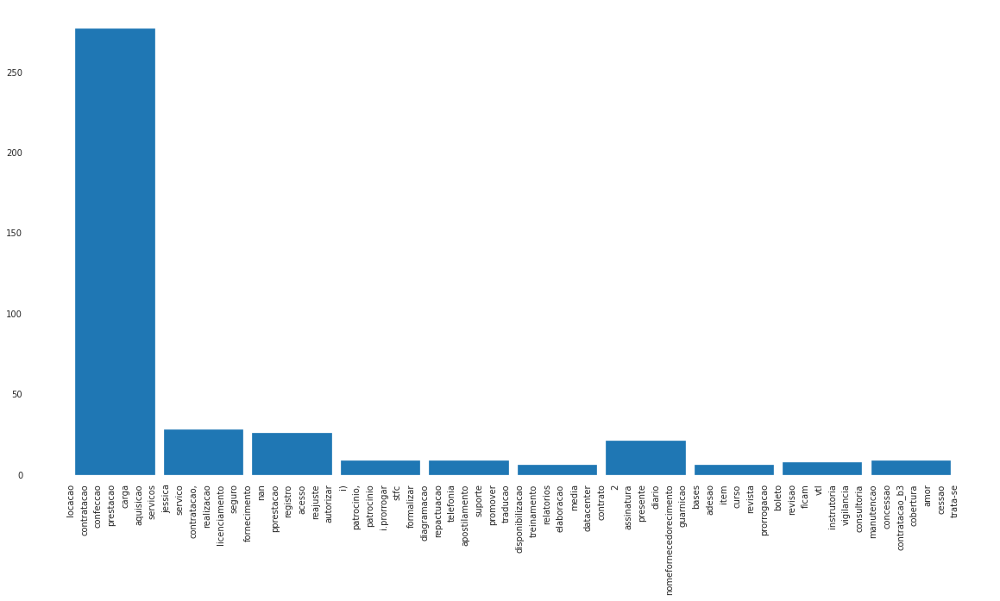

In [95]:
fig = plt.figure(figsize=(20,10))
plt.hist(M, rwidth=0.9)
plt.xticks(rotation=90)
plt.show()

PARECE IMPOSSÍVEL AGRUPAR ESSES OBJETOS, POIS HÁ ERROS DE TODO TIPO ENVOLVIDOS, DESDE  PALAVRAS EMENDADAS ATÉ ERROS DE REPETIÇÃO DE CARACTERES. IMPORTANTE SALIENTAR QUE NÃO HÁ NENHUM ESFORÇO PARA PADRONIZAR, TIPO: **ESPETÁCULO** - amor com amor se paga, PARA QUE SE POSSA SEPARAR OS ESPETÁCULOS DE OUTROS TIPOS DE CONTRATOS.

# MODALIDADES



QUAIS SÃO AS MODALIDADES?

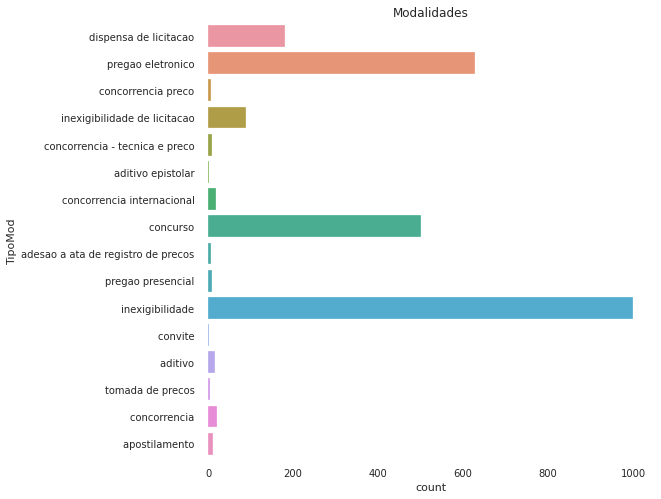

In [96]:
plt.figure(figsize = (8,8))
plt.title('Modalidades')
sns.countplot(y = 'TipoMod', data = dfca)
plt.show()

DENTRO DA INEXIGIBILIDADE, QUAIS OS TIPOS DE OBJETOS?

In [ ]:
dfca.head(50)

In [97]:
INEX = dfca[dfca["TipoMod"] == "inexigibilidade de licitacao "]

In [ ]:
INEX.groupby(['tipo_obj'])
INEX

NÃO É POSSÍVEL AGRUPAR OS OBJETOS DENTRO DA INEXIGIBILIDADE, DEVIDO À HETEROGENEIDADE DAS INFORMAÇÕES.

QUANTOS CONTRATOS TÊM VALOR MENOR OU IGUAL A R$ 1,00

In [99]:
xx = dfca.loc[dfca["valor_global_original"] <= 1.0]
print(len(xx))

525


QUAIS SÃO AS MODALIDADES DESSES CONTRATOS, CUJOS VALORES SÃO <=1,00?

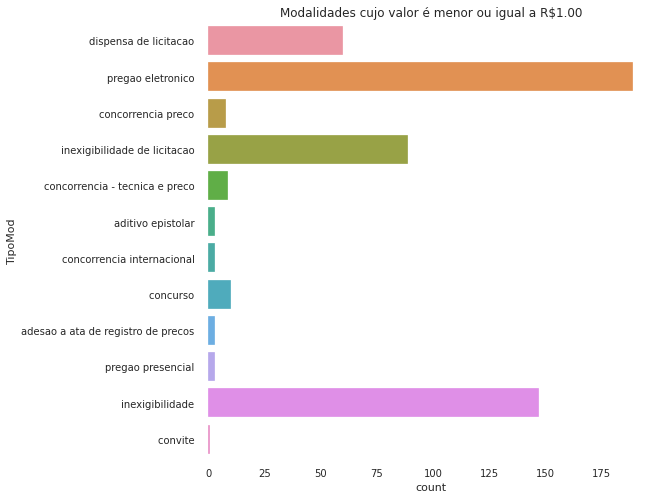

In [100]:
plt.figure(figsize = (8,8))
plt.title('Modalidades cujo valor é menor ou igual a R$1.00')
sns.countplot(y = 'TipoMod', data = xx)
plt.show()

SUPONDO QUE EXISTAM CONTRATOS DE CONCESSÃO (PARTICIPAÇÃO EM FEIRA POR CONVITES, OU CONSIGNAÇÃO DE OBRAS DE ARTE, ENTRE OUTROS) QUE EVENTUALMENTE TENHAM VALOR MONETÁRIO NULO, NÃO HÁ COMO SELECIONÁ-LOS, POIS ESTÃO, PROVAVELMENTE, MISTURADOS A OUTROS (POSSÍVEIS ERROS?)

IDENTIFICAMOS APENAS 5 DESTES (MOSTRADOS ABAIXO), OS DEMAIS NOS PARECEM ERROS DE INSERÇÃO DE DADOS.

QUANTOS E QUAIS CONTRATOS POSSUEM VALOR ORIGINAL E ACUMULADO NULOS?

In [101]:
menor_ou_igual_um = dfca.loc[(dfca["valor_global_original"] == 0.0) & (dfca["valor_global_acumulado"] == 0.0),[ "modalidade","objeto"]]
menor_ou_igual_um

,modalidade,objeto
647,Inexigibilidade 140/2014,comodato ipea_ed bnde - df
777,Inexigibilidade 060/2015,emprestimo de obras pertencentes ao acervo do ...
887,Inexigibilidade 086/2015,contratacao dos servicos do banco central do b...
1522,Inexigibilidade 167/2016,comodato gratuito de bens do bndes em favor da...
1683,Inexigibilidade 046/2017,comodato ao ipea do imovel de propriedade do b...


CONSTRUÇÃO DA NUVEM DE PALAVRAS


In [102]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
lista = dfca.loc[:,'tipo_obj'].copy()
print(lista)

0             carga
1             carga
2         aquisicao
3         aquisicao
4           locacao
           ...     
2505            NaN
2506      prestacao
2507    contratacao
2508     realizacao
2509         acesso
Name: tipo_obj, Length: 2510, dtype: object


In [103]:
for i in range(len(lista)):
  if type(lista[i]) != str:
    del(lista[i])

In [104]:
freq = Counter(lista)
Counter(lista).most_common(20)

[('prestacao', 381),
 ('contratacao', 342),
 ('patrocinio,', 339),
 ('aquisicao', 153),
 ('concessao', 138),
 ('espetaculo', 96),
 ('patrocinio', 76),
 ('contrato', 56),
 ('servicos', 52),
 ('servico', 50),
 ('fornecimento', 45),
 ('assinatura', 30),
 ('escolha', 23),
 ('presente', 22),
 ('analise', 21),
 ('acesso', 19),
 ('edital', 18),
 ('locacao', 14),
 ('participacao', 11),
 ('seguro', 10)]

In [105]:
Dic_Freq = dict(freq)

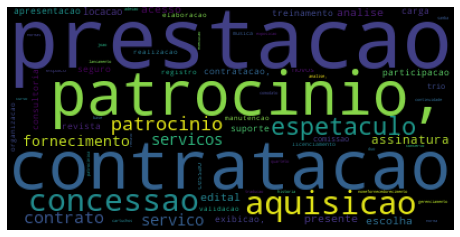

In [106]:
wc = WordCloud(max_words=200, max_font_size=100)

wc.generate_from_frequencies(Dic_Freq)  
#image_colors = ImageColorGenerator(mask)  
#wc.recolor(color_func=image_colors)  

plt.imshow(wc)  # Show word cloud
plt.axis('off')  # Close the axis
plt.show()